In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv('/work/nyka_top_brands_cosmetics_product_reviews.csv')

In [3]:
Brd = df[['brand_name']]

In [4]:
# how many brands are in the dataset
Brd.drop_duplicates(keep='last')

,brand_name
398,Olay
1824,Nykaa Naturals
19476,Nykaa Cosmetics
20250,Nivea
23204,NYX Professional Makeup
30025,Maybelline New York
37024,Lakme
41297,L'Oreal Paris
55085,Kay Beauty
61282,Herbal Essences


## Explanatory analyses 

### 👀 Brands & review rating

- Which brand has the highest average review rating?

- Which month has the most popular review?

- Is there a relationship between "buyer" and "review_rating"? i.e. Do buyers tend to give high review rating? 

undefined. Which brand has the highest average review rating?

In [5]:
df2= df[["review_rating","brand_name"]]

In [6]:
df3 = df2.groupby(['brand_name']).mean()
print(df3)

#can I order in descending order?
#can I round out upto 2 decimal point?

                         review_rating
brand_name                            
Colorbar                      2.000000
Herbal Essences               4.329030
Kay Beauty                    4.701189
L'Oreal Paris                 4.188626
Lakme                         4.276754
Maybelline New York           4.277819
NYX Professional Makeup       4.268879
Nivea                         3.974160
Nykaa Cosmetics               4.463460
Nykaa Naturals                4.131136
Olay                          3.834586


In [7]:
DeepnoteChart(df, """{"mark":{"type":"bar","tooltip":true},"$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{"x":{"sort":null,"type":"nominal","field":"brand_name","scale":{"type":"linear","zero":false}},"y":{"sort":null,"type":"quantitative","field":"review_rating","scale":{"type":"linear","zero":true},"aggregate":"average"},"color":{"sort":null,"type":"nominal","field":"brand_name","scale":{"type":"linear","zero":false}}}}""")

👀 According to the chart, the brand Kay Beauty has the highest average review, followed by Nykaa Cosmetics, Herbal essnces, and Maybelin New York.

👀 The lowest review brand on the other hand is Olay.

2. In which month did people leave the most number of reviews?

undefined. Does the highest # of review month have a high review rating than the other month?

In [8]:
# extracting year from the review_date
df['review_yr'] = pd.DatetimeIndex(df['review_date']).year
df.head()


,product_id,brand_name,review_id,review_title,review_text,author,review_date,review_rating,is_a_buyer,pro_user,review_label,product_title,mrp,price,product_rating,product_rating_count,product_tags,product_url,review_yr
0,781070,Olay,16752142,Worth buying 50g one,Works as it claims. Could see the difference f...,Ashton Dsouza,2021-01-23 15:17:18,5.0,True,False,Verified Buyer,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2021
1,781070,Olay,14682550,Best cream to start ur day,It does what it claims . Best thing is it smoo...,Amrit Neelam,2020-09-07 15:30:42,5.0,True,False,Verified Buyer,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020
2,781070,Olay,15618995,perfect for summers dry for winters,I have been using this product for months now....,Sanchi Gupta,2020-11-13 12:24:14,4.0,True,False,Verified Buyer,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020
3,781070,Olay,13474509,Not a moisturizer,"i have an oily skin, while this whip acts as a...",Ruchi Shah,2020-06-14 11:56:50,3.0,True,False,Verified Buyer,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020
4,781070,Olay,16338982,Average,It's not that good. Please refresh try for oth...,Sukanya Sarkar,2020-12-22 15:24:35,2.0,True,False,Verified Buyer,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020


In [9]:
df['review_yr'].value_counts()

2021    16723
2020    16605
2019    11365
2022     9821
2018     4210
2017     1683
2016      556
2015      266
2014       53
2013        2
Name: review_yr, dtype: int64

The year 2021 has the most number of review.

👀 The # of review is increasing as year goes. This might be obvious in case the users had been keep increasing.

In [10]:
# extracting month from the review_date
df['review_mo'] = pd.DatetimeIndex(df['review_date']).month
df.head()


,product_id,brand_name,review_id,review_title,review_text,author,review_date,review_rating,is_a_buyer,pro_user,review_label,product_title,mrp,price,product_rating,product_rating_count,product_tags,product_url,review_yr,review_mo
0,781070,Olay,16752142,Worth buying 50g one,Works as it claims. Could see the difference f...,Ashton Dsouza,2021-01-23 15:17:18,5.0,True,False,Verified Buyer,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2021,1
1,781070,Olay,14682550,Best cream to start ur day,It does what it claims . Best thing is it smoo...,Amrit Neelam,2020-09-07 15:30:42,5.0,True,False,Verified Buyer,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020,9
2,781070,Olay,15618995,perfect for summers dry for winters,I have been using this product for months now....,Sanchi Gupta,2020-11-13 12:24:14,4.0,True,False,Verified Buyer,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020,11
3,781070,Olay,13474509,Not a moisturizer,"i have an oily skin, while this whip acts as a...",Ruchi Shah,2020-06-14 11:56:50,3.0,True,False,Verified Buyer,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020,6
4,781070,Olay,16338982,Average,It's not that good. Please refresh try for oth...,Sukanya Sarkar,2020-12-22 15:24:35,2.0,True,False,Verified Buyer,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020,12


In [11]:
#if the date format comes in datetime, we can also extract the day/month/year using the to_period function - where 'D', 'M', 'Y' are inputs
# create yyyy-mm format using dt.to_period('M')
df['review_mo_yr'] = pd.to_datetime(df['review_date']).dt.to_period('M')
df.head()

,product_id,brand_name,review_id,review_title,review_text,author,review_date,review_rating,is_a_buyer,pro_user,...,product_title,mrp,price,product_rating,product_rating_count,product_tags,product_url,review_yr,review_mo,review_mo_yr
0,781070,Olay,16752142,Worth buying 50g one,Works as it claims. Could see the difference f...,Ashton Dsouza,2021-01-23 15:17:18,5.0,True,False,...,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2021,1,2021-01
1,781070,Olay,14682550,Best cream to start ur day,It does what it claims . Best thing is it smoo...,Amrit Neelam,2020-09-07 15:30:42,5.0,True,False,...,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020,9,2020-09
2,781070,Olay,15618995,perfect for summers dry for winters,I have been using this product for months now....,Sanchi Gupta,2020-11-13 12:24:14,4.0,True,False,...,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020,11,2020-11
3,781070,Olay,13474509,Not a moisturizer,"i have an oily skin, while this whip acts as a...",Ruchi Shah,2020-06-14 11:56:50,3.0,True,False,...,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020,6,2020-06
4,781070,Olay,16338982,Average,It's not that good. Please refresh try for oth...,Sukanya Sarkar,2020-12-22 15:24:35,2.0,True,False,...,Olay Ultra Lightweight Moisturiser: Luminous W...,1999,1599,4.1,43,NaN,https://www.nykaa.com/olay-ultra-lightweight-m...,2020,12,2020-12


In [12]:
df.sort_values(by='review_mo_yr', inplace=True)
df.head()

,product_id,brand_name,review_id,review_title,review_text,author,review_date,review_rating,is_a_buyer,pro_user,...,product_title,mrp,price,product_rating,product_rating_count,product_tags,product_url,review_yr,review_mo,review_mo_yr
36988,1017,Lakme,96,very good,smells really good. it doesnt leave ur lips lo...,nishika,2013-05-20 16:48:56,4.0,False,False,...,Lakme Lip Gloss,200,200,4.0,1363,NaN,https://www.nykaa.com/lakme-lip-gloss/p/1017,2013,5,2013-05
35027,1290,Lakme,621,Super product for easy touch ups,"Hi girls, Lakme Absolute White Intense Conceal...",Chitralekha Chatterjee,2013-10-07 21:40:16,5.0,False,False,...,Lakme Absolute White Intense SPF 20 Concealer ...,700,560,3.8,1200,NaN,https://www.nykaa.com/lakme-absolute-white-int...,2013,10,2013-10
37610,5612,L'Oreal Paris,18099,Fabulous,OMG!! I love this eyeliner; I generally get sc...,Kirti,2014-04-29 11:09:22,4.0,False,False,...,L'Oreal Paris Superliner Black Lacquer,799,799,4.0,805,NaN,https://www.nykaa.com/l-oreal-superliner-black...,2014,4,2014-04
38045,479,L'Oreal Paris,16272,Very creamy and smooth,Super smooth lippie. Glides on effortlessly. N...,Ridhi,2014-04-16 16:53:57,4.0,False,False,...,L'Oreal Paris Infallible Le Rouge Lipstick,990,990,4.1,766,NaN,https://www.nykaa.com/l-oreal-paris-infaillibl...,2014,4,2014-04
35244,1268,Lakme,21462,nice in small amounts,The sun kissed look gives a pinkish glow so it...,priya,2014-05-23 12:40:32,3.0,False,False,...,Lakme Face Sheer Blusher,450,383,4.1,3370,NaN,https://www.nykaa.com/lakme-face-sheer-blush/p...,2014,5,2014-05


In [13]:
import pandas as pd
from matplotlib import pyplot as plt

In [14]:
DeepnoteChart(df, """{"mark":{"type":"bar","tooltip":true},"$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{"x":{"sort":null,"type":"quantitative","field":"review_mo","scale":{"type":"linear","zero":false}},"y":{"sort":null,"type":"quantitative","field":"COUNT(*)","scale":{"type":"linear","zero":true},"aggregate":"count"},"color":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear","zero":false}}}}""")

👀 If we visualize the review frequency in terms of months, July has exceptionally high number of reviews. 

Q3. Does the highest # of review month have a high review rating than the other month?

In [15]:
new_df= df[["review_rating","brand_name","review_mo"]]

In [16]:
#Average review in terms of month
df_inmonth = new_df.groupby(['review_mo']).mean()
print(df_inmonth)


           review_rating
review_mo               
1               4.430468
2               4.420963
3               4.412228
4               4.493410
5               4.426303
6               4.396602
7               4.385805
8               4.349102
9               4.346374
10              4.409005
11              4.433652
12              4.501427


In [17]:
#Total mean of review rating
df[["review_rating"]].mean()

review_rating    4.414781
dtype: float64

In [18]:
DeepnoteChart(new_df, """{"mark":{"type":"bar","tooltip":true},"$schema":"https://vega.github.io/schema/vega-lite/v5.json","encoding":{"x":{"sort":null,"type":"nominal","field":"review_mo","scale":{"type":"linear","zero":false}},"y":{"sort":null,"type":"quantitative","field":"review_rating","scale":{"type":"linear","zero":true},"aggregate":"average"},"color":{"sort":null,"type":"nominal","field":"","scale":{"type":"linear","zero":false}}}}""")

Answering to the question above, the month July does not particularly has high review. In fact, the reviews are generally very high regardless of months.

Q3-2 Then which brand has the highest review in month July?

In [19]:
print(new_df)

       review_rating               brand_name  review_mo
36988            4.0                    Lakme          5
35027            5.0                    Lakme         10
37610            4.0            L'Oreal Paris          4
38045            4.0            L'Oreal Paris          4
35244            3.0                    Lakme          5
...              ...                      ...        ...
36179            5.0                    Lakme         10
36180            5.0                    Lakme         10
36181            5.0                    Lakme         10
21198            5.0  NYX Professional Makeup         10
55566            4.0          Herbal Essences         10

[61284 rows x 3 columns]


In [20]:
#selecting only July
df_only_7 = new_df.loc[new_df['review_mo'] == 7]

In [21]:
#July's average review in terms of brands
df_inbrand = df_only_7.groupby(['brand_name']).mean()
print(df_inbrand)


                         review_rating  review_mo
brand_name                                       
Herbal Essences               4.091938          7
Kay Beauty                    4.720761          7
L'Oreal Paris                 4.207059          7
Lakme                         4.304619          7
Maybelline New York           4.235378          7
NYX Professional Makeup       4.309904          7
Nivea                         3.831325          7
Nykaa Cosmetics               4.402090          7
Nykaa Naturals                4.036000          7
Olay                          3.878788          7


👀 Previously, it was identified that July has the highest number of review. I have now identified that amongst those reviews Kay Beauty has the highest review rating and Nivea has the lowest review rating. (In fact, Nivea was the second lowest rated brand above.)

Q4. Then are those Nivea customers previously bought the product?

In [22]:
df_only_nivea = df[df['brand_name'].str.contains("Nivea")]


In [23]:
df_only_7 = df_only_nivea.loc[df_only_nivea['review_mo'] == 7]
display(df_only_7)

,product_id,brand_name,review_id,review_title,review_text,author,review_date,review_rating,is_a_buyer,pro_user,...,product_title,mrp,price,product_rating,product_rating_count,product_tags,product_url,review_yr,review_mo,review_mo_yr
20208,8078,Nivea,2448017,Not for oily skin,I’ve got oily skin and didn’t like the product...,Nitisha S,2018-07-22 21:13:53,3.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
20076,8078,Nivea,2356897,A little goes a long way,Lightweight floral scented moisturizer. Not ta...,Sanjula Rambathri,2018-07-12 18:25:14,4.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
20176,8078,Nivea,2367966,Average,It has very thick consistency due to which it ...,Harshita Bisoyi,2018-07-13 22:03:37,3.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19491,8078,Nivea,2461640,Good sun lotion for hands,"For me, it’s too oily for the face but very go...",Joelin Niveditha,2018-07-24 12:02:45,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19895,8078,Nivea,2385863,Worst product,The neutrogena sunscreen is so much better tha...,Sakshi Mittal,2018-07-16 08:25:14,1.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19755,8078,Nivea,27101456,Absolutely necessary,Because I don't know anything else,Sreeparna De,2022-07-30 17:33:16,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2022,7,2022-07
19676,8078,Nivea,26383654,Best sunscreen,It's best sunscreen for combination n dry skin...,Anonymous,2022-07-06 00:02:30,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2022,7,2022-07
19509,8078,Nivea,26822735,Amazing,Prevents tanning and it is a moisturizing suns...,pepilio pepilio,2022-07-24 21:39:22,4.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2022,7,2022-07
19853,8078,Nivea,26512497,"Affordable, and works!","I've used a lot of body SPFs, but nothing work...",Sneha RoyChowdhury,2022-07-11 14:52:19,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2022,7,2022-07


In [24]:
df_only_7['is_a_buyer'].value_counts()

True     73
False    10
Name: is_a_buyer, dtype: int64

👀 According to the analysis, those who have bought Nivea product had previously bought Nivea product before, almost 88%. It indicates that although Nivea has the 2nd lowest rated product, people keep buying the same product. If the company considered getting rid of Nivea due to its low rate, the shouldn't do so since people are keep buying it.

## 👀 K-means & customer review

Q5. Then what those people who have bought Nivea product actually say?

- Positive review: who rated 4-5

- Negative review who rated below 3

In [25]:
# nivea positive reviewers: those who have rated the product 4 and 5
nivea7_pos= df_only_7[df_only_7['review_rating'].isin([4,5])]
nivea7_pos

,product_id,brand_name,review_id,review_title,review_text,author,review_date,review_rating,is_a_buyer,pro_user,...,product_title,mrp,price,product_rating,product_rating_count,product_tags,product_url,review_yr,review_mo,review_mo_yr
20076,8078,Nivea,2356897,A little goes a long way,Lightweight floral scented moisturizer. Not ta...,Sanjula Rambathri,2018-07-12 18:25:14,4.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19491,8078,Nivea,2461640,Good sun lotion for hands,"For me, it’s too oily for the face but very go...",Joelin Niveditha,2018-07-24 12:02:45,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19967,8078,Nivea,2334980,Genuine product.,"Unlike other shopping sites, Nykaa has got all...",Muskaan Gumber,2018-07-10 09:09:59,5.0,False,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19968,8078,Nivea,2388273,Very good,One of the great sunscreen. Feels very lightwe...,meghna adak,2018-07-16 14:00:01,5.0,False,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19822,8078,Nivea,2253337,Best product,It's probably one of the best sunscreen body l...,Manisha Beniwal,2018-07-01 01:21:51,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
20006,8078,Nivea,6173779,Finally.,Nonsticky and no white cast over the skin. the...,fahma abdulsaleem,2019-07-27 23:15:37,5.0,False,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
20141,8078,Nivea,5886534,Good sunscreen,It's good for dry skin type especially. You mi...,Pooja Agarwal,2019-07-06 18:20:09,4.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
20128,8078,Nivea,6042716,Happy with the product.,It is good for summer. Not oily.,Pooja Singh,2019-07-18 16:58:06,4.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
20127,8078,Nivea,6067341,Super sticky.,Thick and Sticky but its moisturize the skin a...,Boinu C,2019-07-20 10:01:06,4.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
20117,8078,Nivea,6048213,Good,Saviour for ldry skin/combination skin types. ...,Sharmistha Debnath,2019-07-18 23:32:41,4.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07


In [26]:
# nivea positive reviewers: those who have rated the product lower than 4

nivea7_neg= df_only_7[df_only_7['review_rating'].isin([1,2,3])]
nivea7_neg

,product_id,brand_name,review_id,review_title,review_text,author,review_date,review_rating,is_a_buyer,pro_user,...,product_title,mrp,price,product_rating,product_rating_count,product_tags,product_url,review_yr,review_mo,review_mo_yr
20208,8078,Nivea,2448017,Not for oily skin,I’ve got oily skin and didn’t like the product...,Nitisha S,2018-07-22 21:13:53,3.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
20176,8078,Nivea,2367966,Average,It has very thick consistency due to which it ...,Harshita Bisoyi,2018-07-13 22:03:37,3.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19895,8078,Nivea,2385863,Worst product,The neutrogena sunscreen is so much better tha...,Sakshi Mittal,2018-07-16 08:25:14,1.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19937,8078,Nivea,5926526,Worst product,It is very greasy. And does not blend properly...,Kanishka Agarwal,2019-07-10 10:37:17,1.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
20160,8078,Nivea,6210184,Not the best one out there.,It is not meant for your face (obviously) and ...,Sravya Cherukuri,2019-07-30 23:33:30,3.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
20054,8078,Nivea,6026081,Good for dry skin,If you are of oily skin type Don't buy it. But...,Aastha Pragya,2019-07-17 16:19:03,2.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
19903,8078,Nivea,6016239,So greasy.,Not absorbing quickly. I regret this product.,Riyaz Ahmed,2019-07-16 22:17:35,1.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
20214,8078,Nivea,6022095,Not for oily skin,It makes my skin more oily. Instead of using o...,Kalyani ganorkar,2019-07-17 12:05:15,3.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
20212,8078,Nivea,5924713,Tinted sunscreen,"After we apply the sunscreen, you can clearly ...",Madhuri Vuchula,2019-07-10 00:45:15,3.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
20083,8078,Nivea,13820163,Ok product,Okay product but quantity is very very less no...,Ms.Simran Kaur,2020-07-12 18:38:26,3.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2020,7,2020-07


In [27]:
!pip install scikit-learn

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


### Negative review title analysis

In [28]:
# analyzing review title
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words = 'english')

X = vectorizer.fit_transform(nivea7_neg["review_title"])

In [29]:
pd.DataFrame(X.toarray(),columns=vectorizer.get_feature_names())

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,average,best,cast,coverage,dry,good,greasy,leaves,nevia,oily,...,quantity,review,skin,sticky,sunscreem,sunscreen,tinted,toooo,white,worst
0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.707107,...,0.0,0.0,0.707107,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
1,1.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
2,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.786346
3,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.786346
4,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
5,0.0,0.0,0.000000,0.000000,0.698914,0.487915,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.522932,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
6,0.0,0.0,0.000000,0.000000,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
7,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.707107,...,0.0,0.0,0.707107,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
8,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.707107,0.707107,0.0,0.000000,0.000000
9,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,...,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000


In [30]:
# finding optimal KMeans
from sklearn.cluster import KMeans
sum_of_squared_distances = []

K = range(2,10)
for k in K:
    km = KMeans(n_clusters=k,max_iter=600, n_init=10)
    km.fit(X)
    sum_of_squared_distances.append(km.inertia_)

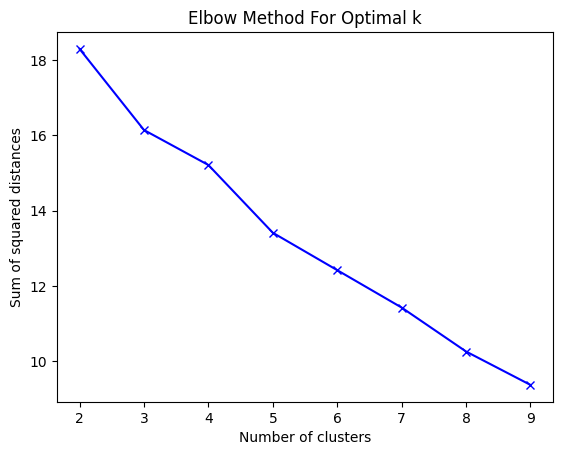

In [31]:
from matplotlib import pyplot as plt

plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()


In [32]:
#Get clusters with the optimal # of clusters identified
true_k = 3
model = KMeans(n_clusters = true_k, init = 'k-means++',max_iter=600, n_init=10)
model.fit(X)

#Get prediction/labels
labels = model.labels_
review_cl = pd.DataFrame(list(zip(nivea7_neg["review_title"],labels)), columns=['review_title','cluster'])
print(review_cl.sort_values(by=['cluster']))


                   review_title  cluster
17   Leaves white cast and oily        0
10            Leaves white cast        0
13                        So so        1
24                       Review        1
23     Good coverage for price.        1
21                 Okay product        1
20              Nevia sunscreem        1
19                       Sticky        1
18                    Too thick        1
16             Pathetic product        1
15                 Toooo thick!        1
12                    Go for it        1
26                    Too thick        1
9                    Ok product        1
8              Tinted sunscreen        1
6                    So greasy.        1
4   Not the best one out there.        1
3                 Worst product        1
2                 Worst product        1
1                       Average        1
11        Quantity is very less        1
25       Not good for oily skin        2
14                  Not good!!!        2
7             No

In [33]:
!pip install wordcloud==1.8.2.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 458.6/458.6 KB 421.5 kB/s eta 0:00:00
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


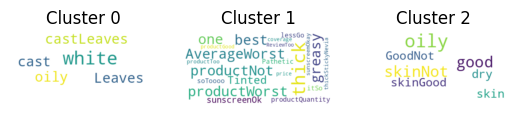

In [34]:
#Create a wordcloud

from wordcloud import WordCloud

for k in range(true_k):
    text = review_cl[review_cl.cluster == k]['review_title'].str.cat(sep = '')
    wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "white").generate(text)


#Create subplot
    plt.subplot(1,3,k+1).set_title("Cluster " + str(k))
    plt.plot()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
plt.show()

Based on the k-means analysis of Nivea's negative review (0-3), people seem they don't like Nivea product since it's too oily and too thick.

### Negative review text analysis

👀Then what about from actual review?

In [35]:
# analyzing review text

from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words = 'english',ngram_range= (1,1))

X = vectorizer.fit_transform(nivea7_neg["review_text"])

In [36]:
pd.DataFrame(X.toarray(),columns=vectorizer.get_feature_names())

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,15,20,50,absorb,absorbing,according,affordable,application,apply,applying,...,used,using,various,ve,vvvvv,wast,waste,white,whitish,worth
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.239836,0.000000,0.320548,0.000000,0.000000,0.000000,0.162720,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.235368,0.198186,0.000000,0.000000,0.000000,0.000000,0.000000,0.268924,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.233961,0.000000,0.000000
4,0.000000,0.000000,0.227650,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.130053,0.000000,0.000000
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.000000,0.000000,0.551944,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.223990,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.311661,0.288054,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.195434,0.000000,0.000000
9,0.000000,0.000000,0.000000,0.000000,0.000000,0.276584,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.276584


In [37]:
#finding optimal 
from sklearn.cluster import KMeans
sum_of_squared_distances = []

K = range(2,10)
for k in K:
    km = KMeans(n_clusters=k,max_iter=600, n_init=10)
    km.fit(X)
    sum_of_squared_distances.append(km.inertia_)

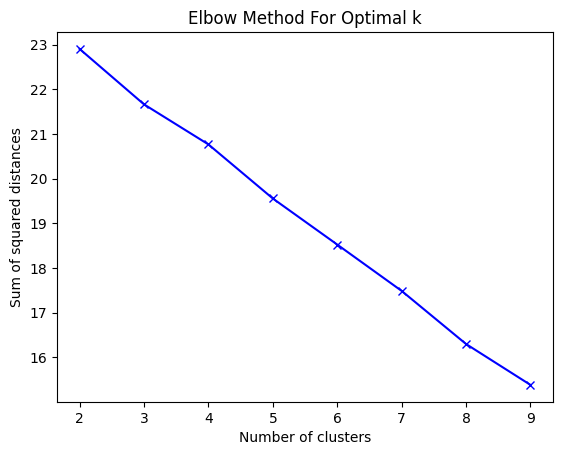

In [38]:
from matplotlib import pyplot as plt

plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()


In [39]:
#Get clusters with the optimal # of clusters identified
true_k = 3
model = KMeans(n_clusters = true_k, init = 'k-means++',max_iter=600, n_init=10)
model.fit(X)

#Get prediction/labels
labels = model.labels_
review_cl = pd.DataFrame(list(zip(nivea7_neg["review_text"],labels)), columns=['review_text','cluster'])
print(review_cl.sort_values(by=['cluster']))


                                          review_text  cluster
0   I’ve got oily skin and didn’t like the product...        0
15  I did not like it at all.. it is too thick & f...        0
14  This product is not at all good. It has got a ...        0
25  It has a little bit of white cast which is oka...        0
12  1. I have sensitive skin so not recommended fo...        0
11  Took some time to absorb in the skin but I thi...        0
19  Apply it as body sunscreen, too sticky even fo...        0
9   Okay product but quantity is very very less no...        0
18  I have used various spf 50 sunscreen but this ...        0
7   It makes my skin more oily. Instead of using o...        0
6       Not absorbing quickly. I regret this product.        0
5   If you are of oily skin type Don't buy it. But...        0
4   It is not meant for your face (obviously) and ...        0
3   It is very greasy. And does not blend properly...        0
2   The neutrogena sunscreen is so much better tha...  

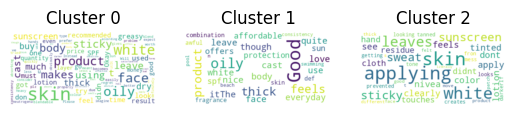

In [40]:
#Create a wordcloud

from wordcloud import WordCloud

for k in range(true_k):
    text = review_cl[review_cl.cluster == k]['review_text'].str.cat(sep = '')
    wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "white").generate(text)


#Create subplot
    plt.subplot(2 ,3 ,k+1).set_title("Cluster " + str(k))
    plt.plot()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
plt.show()

The wordclouds of the negative rated reviews & titles do not show critical insights. Wanna compare it with positive reviews' clouds...

### Positive review title analysis

In [41]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words = 'english')

Xpos = vectorizer.fit_transform(nivea7_pos["review_title"])

In [42]:
pd.DataFrame(Xpos.toarray(),columns=vectorizer.get_feature_names())

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,50,absolutely,affordable,amazing,awesome,best,budget,cast,cost,definitely,...,sunscream,sunscreen,super,time,try,water,way,white,works,worth
0,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.511493,0.000000,0.000000,0.000000
1,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.00000,0.000000,0.000000,0.000000,0.000000,0.752468,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
5,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.793818,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.740789,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
9,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000


In [43]:
from sklearn.cluster import KMeans
sum_of_squared_distances = []

K = range(2,10)
for k in K:
    km = KMeans(n_clusters=k,max_iter=600, n_init=10)
    km.fit(Xpos)
    sum_of_squared_distances.append(km.inertia_)

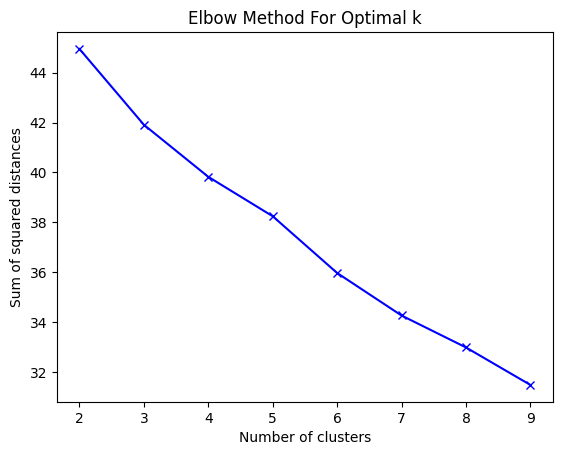

In [44]:
from matplotlib import pyplot as plt

plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()


In [45]:
#Get clusters with the optimal # of clusters identified
true_k = 4
model = KMeans(n_clusters = true_k, init = 'k-means++',max_iter=600, n_init=10)
model.fit(Xpos)

#Get prediction/labels
labels = model.labels_
review_cl = pd.DataFrame(list(zip(nivea7_pos["review_text"],labels)), columns=['review_text','cluster'])
print(review_cl.sort_values(by=['cluster']))


                                          review_text  cluster
0   Lightweight floral scented moisturizer. Not ta...        0
25  I love nivea as a skincare brand and I do like...        0
54  I've used a lot of body SPFs, but nothing work...        0
29  Helped me from getting tanned at the beach but...        0
31  This is the best sunscreen ever. It has pa++++...        0
32              I use it as a body lotion its amazing        0
33  Lotion is nice. One drop can cover good area w...        0
34  One of the most trusted brands, It moisturizes...        0
35  It's a perfect sunscreen for my skin. It works...        0
24  Such a great moisturizer + SPF. I'm impressed....        0
36  When used for face,it caused breakout, so can ...        0
40  Worth every penny you spend. Bit sticky but al...        0
41  Yes.. Yes... Sun protection in a lotion is the...        0
44  Although the price is little too high for the ...        0
46  i'm very concerned about sun protection and th...  

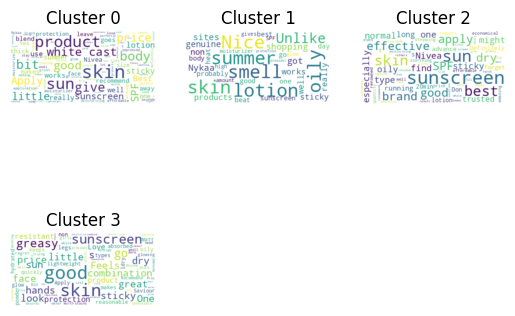

In [46]:
#Create a wordcloud

from wordcloud import WordCloud

for k in range(true_k):
    text = review_cl[review_cl.cluster == k]['review_text'].str.cat(sep = '')
    wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "white").generate(text)


#Create subplot
    plt.subplot(2 ,3 ,k+1).set_title("Cluster " + str(k))
    plt.plot()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
plt.show()

Still none of the positive reviews keyword catch my attention. i.e. the reviews between those who rated 0-3 and 4-5 didn't really use different words when they were rating the product. 

Possible suggestions: 

1. re-scale the nivea7_pos and nivea7_neg to (5) and (0) only (but # of reviews would be so different)

undefined. instead of nivea, use other product and do the same => which wants to analyze the review

## Re-analysis (re-scaled)

- Positive review: <previous> rated 4& 5 ==> <now> 5

- Negative review: <previous> rated 1,2 &3 ==> <now> 1 and 2

In [47]:
# Instead of finding those who reviewed 4 and 5 as positive, only who reviewd 5 as positive reviewer

nivea7_pos= df_only_7[df_only_7['review_rating'].isin([5])]
nivea7_pos

,product_id,brand_name,review_id,review_title,review_text,author,review_date,review_rating,is_a_buyer,pro_user,...,product_title,mrp,price,product_rating,product_rating_count,product_tags,product_url,review_yr,review_mo,review_mo_yr
19491,8078,Nivea,2461640,Good sun lotion for hands,"For me, it’s too oily for the face but very go...",Joelin Niveditha,2018-07-24 12:02:45,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19967,8078,Nivea,2334980,Genuine product.,"Unlike other shopping sites, Nykaa has got all...",Muskaan Gumber,2018-07-10 09:09:59,5.0,False,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19968,8078,Nivea,2388273,Very good,One of the great sunscreen. Feels very lightwe...,meghna adak,2018-07-16 14:00:01,5.0,False,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19822,8078,Nivea,2253337,Best product,It's probably one of the best sunscreen body l...,Manisha Beniwal,2018-07-01 01:21:51,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
20006,8078,Nivea,6173779,Finally.,Nonsticky and no white cast over the skin. the...,fahma abdulsaleem,2019-07-27 23:15:37,5.0,False,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
19565,8078,Nivea,5970165,Very nice,Product on Nykaa always are authentic.,winnie sharma,2019-07-13 16:34:04,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
19566,8078,Nivea,5983038,Not satisfied,While opening the product page it is showing t...,Nikita,2019-07-14 16:12:38,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
19567,8078,Nivea,6064031,Good!,Not very thick and does its job.,Neelushka Pankaj,2019-07-19 23:24:17,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
19568,8078,Nivea,6133796,Great product,This is my go-to day moisturizer gives skin a ...,Ananya Chatterjee,2019-07-24 21:10:14,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
19816,8078,Nivea,6044088,Nivea spf 50+,Best to roam around under sun....gives proper ...,Mini Verma,2019-07-18 18:27:01,5.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07


In [48]:
# Instead of finding those who reviewed 1,2 and 3 as negative, only who reviewd 1,2 as negative reviewer

nivea7_neg= df_only_7[df_only_7['review_rating'].isin([1,2])]
nivea7_neg

,product_id,brand_name,review_id,review_title,review_text,author,review_date,review_rating,is_a_buyer,pro_user,...,product_title,mrp,price,product_rating,product_rating_count,product_tags,product_url,review_yr,review_mo,review_mo_yr
19895,8078,Nivea,2385863,Worst product,The neutrogena sunscreen is so much better tha...,Sakshi Mittal,2018-07-16 08:25:14,1.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2018,7,2018-07
19937,8078,Nivea,5926526,Worst product,It is very greasy. And does not blend properly...,Kanishka Agarwal,2019-07-10 10:37:17,1.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
20054,8078,Nivea,6026081,Good for dry skin,If you are of oily skin type Don't buy it. But...,Aastha Pragya,2019-07-17 16:19:03,2.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
19903,8078,Nivea,6016239,So greasy.,Not absorbing quickly. I regret this product.,Riyaz Ahmed,2019-07-16 22:17:35,1.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2019,7,2019-07
20190,8078,Nivea,13954309,Leaves white cast,Good but leave white cast....,R R T,2020-07-22 20:18:14,2.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2020,7,2020-07
20057,8078,Nivea,13803737,So so,I dont like this lotion from nivea. It leaves ...,Divya Daniel,2020-07-11 15:12:10,2.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2020,7,2020-07
19950,8078,Nivea,13790539,Not good!!!,This product is not at all good. It has got a ...,Dharini C,2020-07-10 16:07:05,1.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2020,7,2020-07
19876,8078,Nivea,19747274,Toooo thick!,I did not like it at all.. it is too thick & f...,Tajia Rehman,2021-07-29 12:46:43,1.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2021,7,2021-07
19875,8078,Nivea,19739190,Pathetic product,"Don't wast your money in this product , sticky...",Neha Rawat,2021-07-29 08:47:41,1.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2021,7,2021-07
19877,8078,Nivea,19758939,Leaves white cast and oily,"Don’t buy this it’s waste of money , this prod...",alisha pandey,2021-07-29 16:50:51,1.0,True,False,...,"NIVEA Sun Lotion, SPF 50, with UVA & UVB Prote...",360,342,4.1,4431,NaN,https://www.nykaa.com/nivea-moisturising-sun-l...,2021,7,2021-07


### Negative review text analysis

In [49]:
# re-analyzing review title (negative)
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words = 'english')

X = vectorizer.fit_transform(nivea7_neg["review_text"])

In [50]:
pd.DataFrame(X.toarray(),columns=vectorizer.get_feature_names())

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,50,absorbing,application,apply,applying,arms,bad,beach,better,blend,...,try,type,used,using,various,vvvvv,wast,waste,white,whitish
0,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.251454,0.000000,...,0.000000,0.000000,0.217636,0.251454,0.00000,0.000000,0.000000,0.000000,0.293937,0.00000
1,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.419452,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.245160,0.00000
2,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.351259,0.405839,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000
3,0.00000,0.542008,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.00000
4,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.356775,0.00000
5,0.00000,0.000000,0.00000,0.000000,0.186066,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.251299,0.00000
6,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.256032,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.149645,0.00000
7,0.00000,0.000000,0.42647,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.42647
8,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.412699,0.000000,0.000000,0.00000
9,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.00000,0.395316,0.000000,0.395316,0.231053,0.00000


In [51]:
from sklearn.cluster import KMeans
sum_of_squared_distances = []

K = range(2,10)
for k in K:
    km = KMeans(n_clusters=k,max_iter=600, n_init=10)
    km.fit(X)
    sum_of_squared_distances.append(km.inertia_)

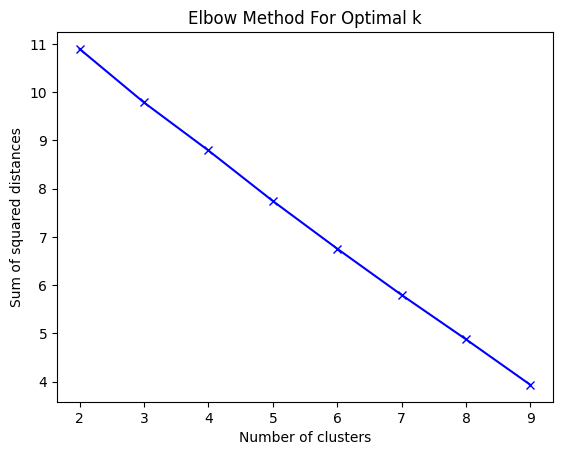

In [52]:
from matplotlib import pyplot as plt

plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()


In [53]:
#Get clusters with the optimal # of clusters identified
true_k = 3
model = KMeans(n_clusters = true_k, init = 'k-means++',max_iter=600, n_init=10)
model.fit(X)

#Get prediction/labels
labels = model.labels_
review_cl = pd.DataFrame(list(zip(nivea7_neg["review_text"],labels)), columns=['review_text','cluster'])
print(review_cl.sort_values(by=['cluster']))


                                          review_text  cluster
0   The neutrogena sunscreen is so much better tha...        0
1   It is very greasy. And does not blend properly...        0
10  I have used various spf 50 sunscreen but this ...        0
11  Apply it as body sunscreen, too sticky even fo...        0
2   If you are of oily skin type Don't buy it. But...        1
5   I dont like this lotion from nivea. It leaves ...        1
6   This product is not at all good. It has got a ...        1
7   I did not like it at all.. it is too thick & f...        1
12              After applying skin tone looks darker        1
13  The product is def. Not for oily or combinatio...        1
3       Not absorbing quickly. I regret this product.        2
4                       Good but leave white cast....        2
8   Don't wast your money in this product , sticky...        2
9   Don’t buy this it’s waste of money , this prod...        2


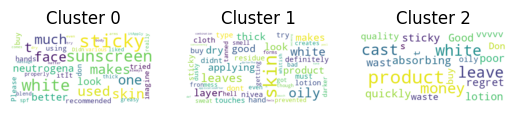

In [54]:
#Create a wordcloud

from wordcloud import WordCloud

for k in range(true_k):
    text = review_cl[review_cl.cluster == k]['review_text'].str.cat(sep = '')
    wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "white").generate(text)


#Create subplot

    plt.subplot(2 ,3 ,k+1).set_title("Cluster " + str(k))
    plt.plot()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
plt.show()

### Positive review text analysis

In [55]:
# re-analyzing review title (positive)
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(stop_words = 'english')

X = vectorizer.fit_transform(nivea7_pos["review_text"])

In [56]:
pd.DataFrame(X.toarray(),columns=vectorizer.get_feature_names())

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


,100,50,absorb,absorbed,absorbs,according,actually,affordable,amazing,application,...,used,using,vacation,ve,wear,white,wonderful,works,worth,yes
0,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.267928,0.000000,0.000000
2,0.000000,0.000000,0.0000,0.397493,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.293220,0.0000,0.000000,0.000000,0.000000,0.000000,0.319380,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.256351,0.000000,0.000000,0.000000,0.000000
5,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.351634,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [57]:
from sklearn.cluster import KMeans
sum_of_squared_distances = []

K = range(2,10)
for k in K:
    km = KMeans(n_clusters=k,max_iter=600, n_init=10)
    km.fit(X)
    sum_of_squared_distances.append(km.inertia_)

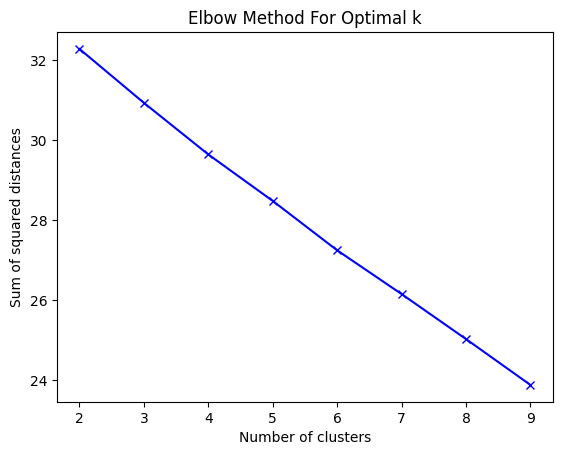

In [58]:
from matplotlib import pyplot as plt

plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('Number of clusters')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()


In [59]:
#Get clusters with the optimal # of clusters identified
true_k = 4
model = KMeans(n_clusters = true_k, init = 'k-means++',max_iter=600, n_init=10)
model.fit(X)

#Get prediction/labels
labels = model.labels_
review_cl = pd.DataFrame(list(zip(nivea7_pos["review_text"],labels)), columns=['review_text','cluster'])
print(review_cl.sort_values(by=['cluster']))


                                          review_text  cluster
0   For me, it’s too oily for the face but very go...        0
1   Unlike other shopping sites, Nykaa has got all...        0
2   One of the great sunscreen. Feels very lightwe...        0
34  I've used a lot of body SPFs, but nothing work...        0
16  It doesn’t absorb totally into your skin, litt...        0
13  Good product, good smell and absorbs well. Any...        0
24  Worth every penny you spend. Bit sticky but al...        0
26      This is a good sunblock. but it feels sticky.        0
15  Very economical and effective sunscreen and fr...        1
20              I use it as a body lotion its amazing        1
19  This is the best sunscreen ever. It has pa++++...        1
30  Budget friendly and works very well at the sam...        1
33  It's best sunscreen for combination n dry skin...        1
4   Nonsticky and no white cast over the skin. the...        1
3   It's probably one of the best sunscreen body l...  

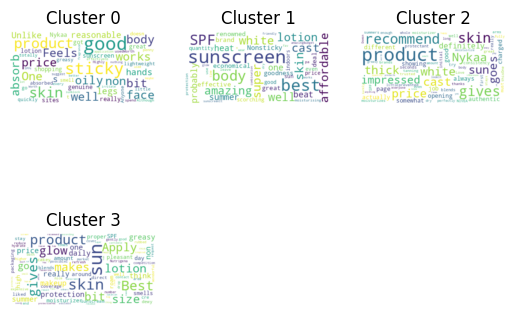

In [60]:
#Create a wordcloud

from wordcloud import WordCloud

for k in range(true_k):
    text = review_cl[review_cl.cluster == k]['review_text'].str.cat(sep = '')
    wordcloud = WordCloud(max_font_size = 50, max_words = 100, background_color = "white").generate(text)


#Create subplot
    plt.subplot(2 ,3 ,k+1).set_title("Cluster " + str(k))
    plt.plot()
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
plt.show()

# Addition: Building summary of Nivea product 

In [61]:
display(df)

,product_id,brand_name,review_id,review_title,review_text,author,review_date,review_rating,is_a_buyer,pro_user,...,product_title,mrp,price,product_rating,product_rating_count,product_tags,product_url,review_yr,review_mo,review_mo_yr
36988,1017,Lakme,96,very good,smells really good. it doesnt leave ur lips lo...,nishika,2013-05-20 16:48:56,4.0,False,False,...,Lakme Lip Gloss,200,200,4.0,1363,NaN,https://www.nykaa.com/lakme-lip-gloss/p/1017,2013,5,2013-05
35027,1290,Lakme,621,Super product for easy touch ups,"Hi girls, Lakme Absolute White Intense Conceal...",Chitralekha Chatterjee,2013-10-07 21:40:16,5.0,False,False,...,Lakme Absolute White Intense SPF 20 Concealer ...,700,560,3.8,1200,NaN,https://www.nykaa.com/lakme-absolute-white-int...,2013,10,2013-10
37610,5612,L'Oreal Paris,18099,Fabulous,OMG!! I love this eyeliner; I generally get sc...,Kirti,2014-04-29 11:09:22,4.0,False,False,...,L'Oreal Paris Superliner Black Lacquer,799,799,4.0,805,NaN,https://www.nykaa.com/l-oreal-superliner-black...,2014,4,2014-04
38045,479,L'Oreal Paris,16272,Very creamy and smooth,Super smooth lippie. Glides on effortlessly. N...,Ridhi,2014-04-16 16:53:57,4.0,False,False,...,L'Oreal Paris Infallible Le Rouge Lipstick,990,990,4.1,766,NaN,https://www.nykaa.com/l-oreal-paris-infaillibl...,2014,4,2014-04
35244,1268,Lakme,21462,nice in small amounts,The sun kissed look gives a pinkish glow so it...,priya,2014-05-23 12:40:32,3.0,False,False,...,Lakme Face Sheer Blusher,450,383,4.1,3370,NaN,https://www.nykaa.com/lakme-face-sheer-blush/p...,2014,5,2014-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36179,1139,Lakme,29480692,Lakme,I'm first time order lakme true nail polish th...,Anushka Rathore,2022-10-17 19:50:36,5.0,True,False,...,Lakme True Wear Nail Color,125,125,4.1,11663,NaN,https://www.nykaa.com/lakme-true-wear-nail-col...,2022,10,2022-10
36180,1139,Lakme,29465828,Best one,Loved the colour and found what i was looking ...,Divya Lankesh,2022-10-17 13:13:28,5.0,True,False,...,Lakme True Wear Nail Color,125,125,4.1,11663,NaN,https://www.nykaa.com/lakme-true-wear-nail-col...,2022,10,2022-10
36181,1139,Lakme,29401764,Pretty,It's a really pretty pink shade. Doesn't chip off,Maitri Shah,2022-10-15 11:50:59,5.0,True,False,...,Lakme True Wear Nail Color,125,125,4.1,11663,NaN,https://www.nykaa.com/lakme-true-wear-nail-col...,2022,10,2022-10
21198,42114,NYX Professional Makeup,29530549,OMG!,This is such a nice product! It makes contouri...,Damon Salvatore,2022-10-19 12:51:17,5.0,False,False,...,NYX Professional Makeup Wonder Stick,835,835,3.8,1131,NaN,https://www.nykaa.com/nyx-professional-makeup-...,2022,10,2022-10


In [62]:
df_review = df[['brand_name','review_title', 'review_text']]
df_review

,brand_name,review_title,review_text
36988,Lakme,very good,smells really good. it doesnt leave ur lips lo...
35027,Lakme,Super product for easy touch ups,"Hi girls, Lakme Absolute White Intense Conceal..."
37610,L'Oreal Paris,Fabulous,OMG!! I love this eyeliner; I generally get sc...
38045,L'Oreal Paris,Very creamy and smooth,Super smooth lippie. Glides on effortlessly. N...
35244,Lakme,nice in small amounts,The sun kissed look gives a pinkish glow so it...
...,...,...,...
36179,Lakme,Lakme,I'm first time order lakme true nail polish th...
36180,Lakme,Best one,Loved the colour and found what i was looking ...
36181,Lakme,Pretty,It's a really pretty pink shade. Doesn't chip off
21198,NYX Professional Makeup,OMG!,This is such a nice product! It makes contouri...


In [63]:
!pip install bert-extractive-summarizer

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 828.4 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 661.8/661.8 KB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.5/163.5 KB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 2.8 MB/s eta 0:00:00
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [64]:
book_reviews = df_review

#Aggregate reviews for each book title
book_reviews['review_text'] = book_reviews['review_text'].astype(str)
book_reviews_agg = book_reviews.groupby(['brand_name'], as_index = False ).agg({'review_text': ' '.join})
book_reviews_agg

/tmp/ipykernel_75/2434271430.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  book_reviews['review_text'] = book_reviews['review_text'].astype(str)


,brand_name,review_text
0,Colorbar,It is so irritating so bad i don't like this much
1,Herbal Essences,Makes hair soft and doesn't strip off the mois...
2,Kay Beauty,It’s not a pure red but Nice and smooth finish...
3,L'Oreal Paris,OMG!! I love this eyeliner; I generally get sc...
4,Lakme,smells really good. it doesnt leave ur lips lo...
5,Maybelline New York,"and cheap too I used this product for 4 years,..."
6,NYX Professional Makeup,This is a very nice product which can be blend...
7,Nivea,This is a good non-sticky product. The only pr...
8,Nykaa Cosmetics,It doesn't remove tough glitter nail polishes ...
9,Nykaa Naturals,The stitching of the mask is lose at some plac...


Using this dataset, we're going to create a summary of each data set. 

In [65]:
brand = 'Nivea'
review_text = book_reviews_agg.query(f'brand_name == @brand', engine='python')['review_text'].values[0]

In [66]:
review_text = review_text[:1000]

In [67]:
from summarizer import Summarizer
import spacy

bert_model = Summarizer()
bert_summary = ''.join(bert_model(review_text, ratio = 0.2))

/shared-libs/python3.9/py/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2022-11-14 20:23:21.306677: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-11-14 20:23:21.503671: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-11-14 20:23:21.503718: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
202

In [68]:
print(bert_summary)

The only problem is that it creates a white cast on skin after application. very soft and protects your skin well from the sun.


<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=31f8024f-c40d-4b30-a88f-eeb66557e1b4' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>